In [1]:
import cv2

# Load the video file
video_path = 'test_video.mp4'
cap = cv2.VideoCapture(video_path)

# Set the frame interval
frame_interval = 60
frame_count = 0

# Read and save frames at the specified interval
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    
    if frame_count % frame_interval == 0:
        output_path = f'./output/frame_{frame_count}.jpg'
        cv2.imwrite(output_path, frame)
    
    frame_count += 1

# Release the video capture object
cap.release()


In [1]:
import matplotlib.pyplot as plt
from time import time
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
import cv2 as cv


In [2]:
model_path = './models/pose_landmarker.task'

In [3]:
# Load the input image from an image file.
mp_image = mp.Image.create_from_file('output/frame_0.jpg')

In [49]:
BaseOptions = mp.tasks.BaseOptions
PoseLandmarker = mp.tasks.vision.PoseLandmarker
PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
VisionRunningMode = mp.tasks.vision.RunningMode

options = PoseLandmarkerOptions(
    base_options=BaseOptions(model_asset_path=model_path),
    running_mode=VisionRunningMode.IMAGE)

landmarker = PoseLandmarker.create_from_options(options)


I0000 00:00:1711974583.336280       1 gl_context.cc:344] GL version: 2.1 (2.1 Metal - 88), renderer: Apple M2


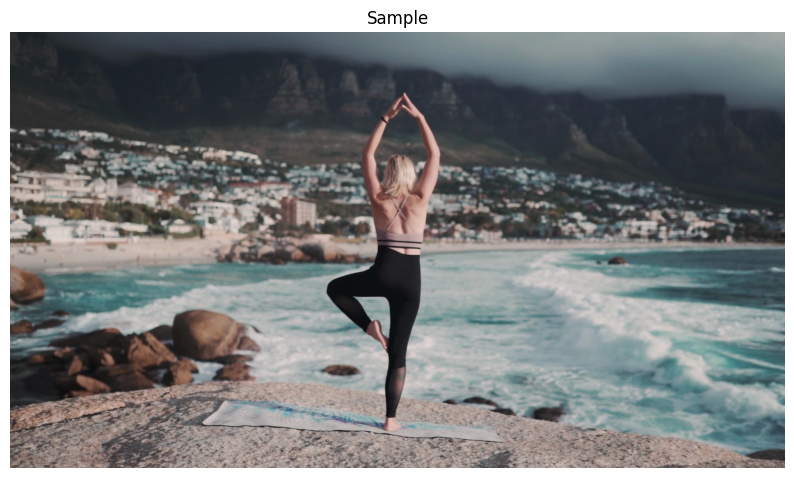

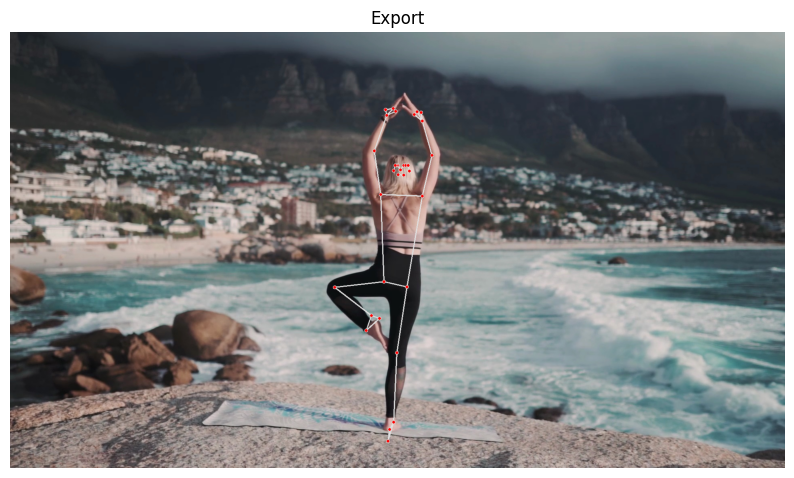

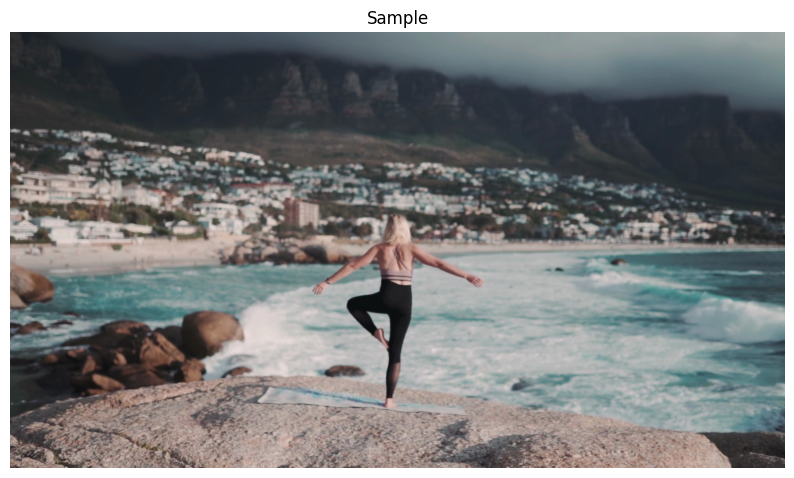

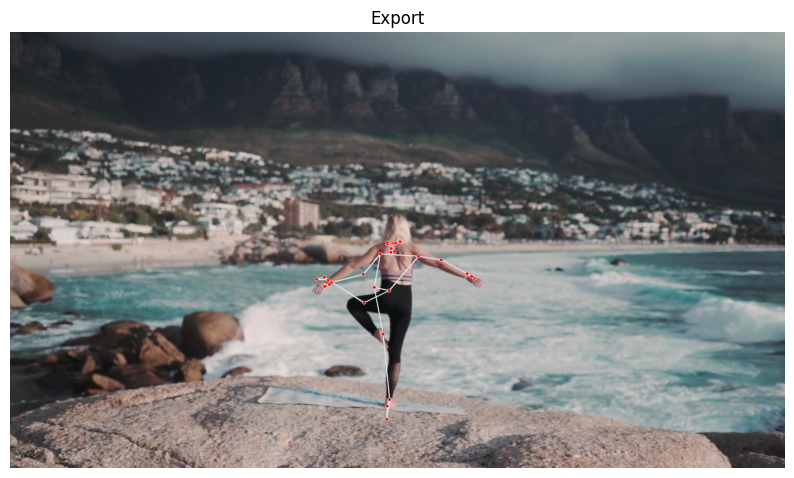

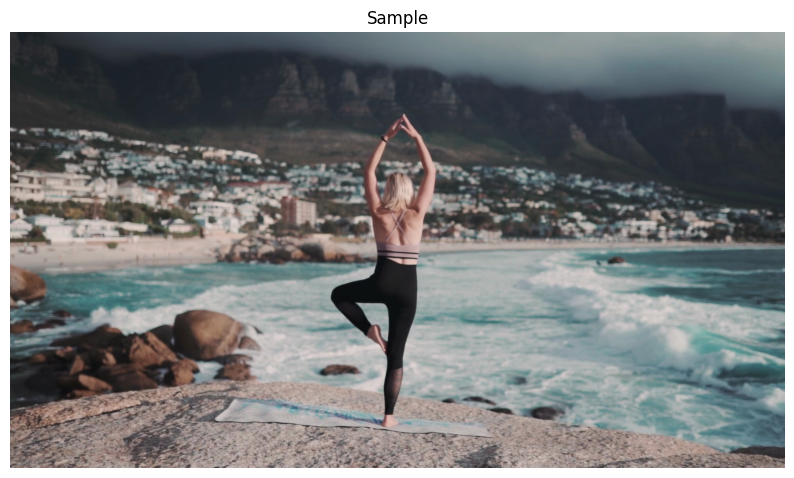

...

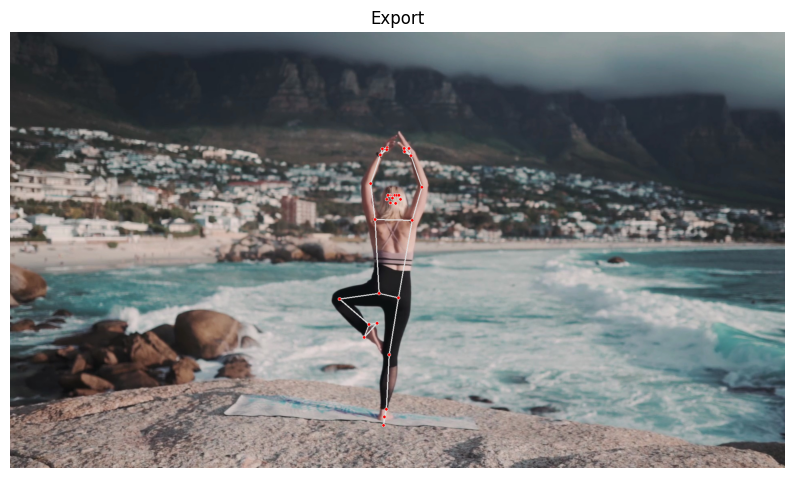

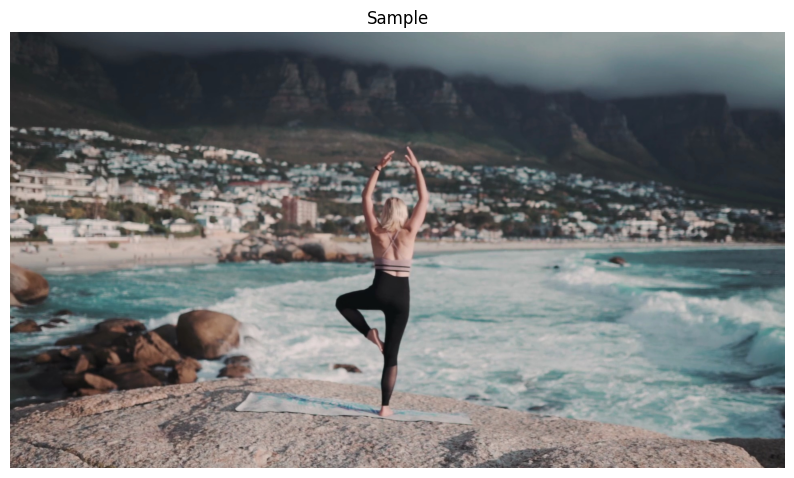

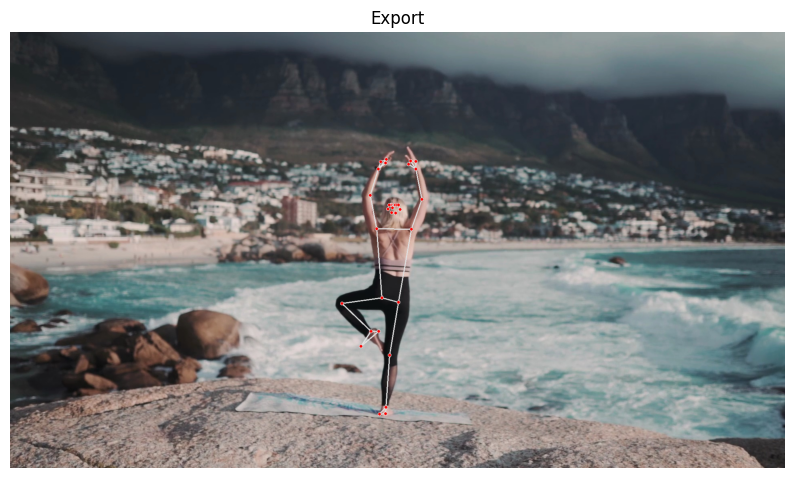

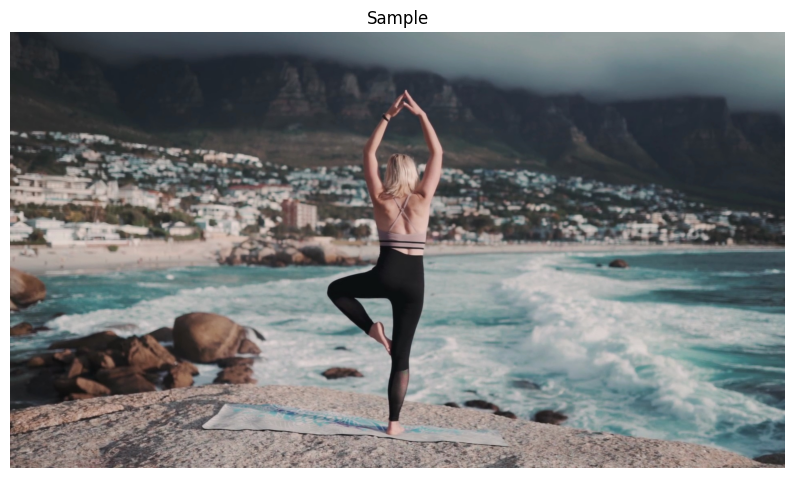

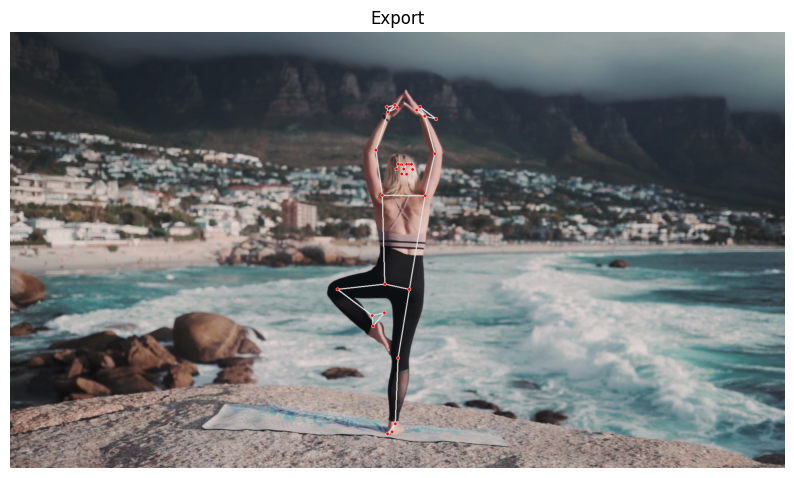

In [53]:
import os
for i in os.listdir('output'):
    path = os.path.join("./output", i)
    mp_image = mp.Image.create_from_file(path)
    image = cv.imread(path)
    plt.figure(figsize=[10, 10])
    plt.title('Sample')
    plt.axis('off')
    plt.imshow(image[:, :, ::-1])
    plt.show()
    pose_landmarker_result = landmarker.detect(mp_image)
    
    lst = []
    for i in pose_landmarker_result.pose_landmarks[0]:
        lst.append(B(i))

    tmp = A(lst)
    imgCopy = image.copy()

    mpDraw.draw_landmarks(imgCopy, tmp, connections=connection)
    fig = plt.figure(figsize=[10, 10])
    plt.title('Export')
    plt.axis('off')
    plt.imshow(imgCopy[:, :, ::-1])
    plt.show()

In [13]:
result.pose_landmarks[0][:3]

[NormalizedLandmark(x=0.5097553730010986, y=0.46221184730529785, z=0.06419557332992554, visibility=0.9999656677246094, presence=0.9999990463256836),
 NormalizedLandmark(x=0.5089194774627686, y=0.45581531524658203, z=0.049526795744895935, visibility=0.9999511241912842, presence=0.9999979734420776),
 NormalizedLandmark(x=0.5069779753684998, y=0.45498794317245483, z=0.04955853521823883, visibility=0.9999487400054932, presence=0.9999978542327881)]

In [14]:
result.pose_world_landmarks[0][:3]

[Landmark(x=0.06151646003127098, y=-0.611725389957428, z=0.05492877960205078, visibility=0.9999656677246094, presence=0.9999990463256836),
 Landmark(x=0.05186127871274948, y=-0.6503813862800598, z=0.043811798095703125, visibility=0.9999511241912842, presence=0.9999979734420776),
 Landmark(x=0.05148451030254364, y=-0.6503152251243591, z=0.0422515869140625, visibility=0.9999487400054932, presence=0.9999978542327881)]

In [50]:
body_parts = {
    0: 'nose',
    1: 'left eye (inner)',
    2: 'left eye',
    3: 'left eye (outer)',
    4: 'right eye (inner)',
    5: 'right eye',
    6: 'right eye (outer)',
    7: 'left ear',
    8: 'right ear',
    9: 'mouth (left)',
    10: 'mouth (right)',
    11: 'left shoulder',
    12: 'right shoulder',
    13: 'left elbow',
    14: 'right elbow',
    15: 'left wrist',
    16: 'right wrist',
    17: 'left pinky',
    18: 'right pinky',
    19: 'left index',
    20: 'right index',
    21: 'left thumb',
    22: 'right thumb',
    23: 'left hip',
    24: 'right hip',
    25: 'left knee',
    26: 'right knee',
    27: 'left ankle',
    28: 'right ankle',
    29: 'left heel',
    30: 'right heel',
    31: 'left foot index',
    32: 'right foot index'
}


In [24]:

for i in range(2):
    print(body_parts[i])
    print(result.pose_landmarks[0][i])


nose
NormalizedLandmark(x=0.5097553730010986, y=0.46221184730529785, z=0.06419557332992554, visibility=0.9999656677246094, presence=0.9999990463256836)
left eye (inner)
NormalizedLandmark(x=0.5089194774627686, y=0.45581531524658203, z=0.049526795744895935, visibility=0.9999511241912842, presence=0.9999979734420776)


In [25]:
imgHeight, imgWidth, _ = image.shape


In [26]:
if result.pose_landmarks:
    for i in range(2):
        print(body_parts[i])
        print(result.pose_landmarks[0][i].x * imgWidth)
        print(result.pose_landmarks[0][i].y * imgHeight)
        print(result.pose_landmarks[0][i].z * imgWidth)
        print(result.pose_landmarks[0][i].visibility)

nose
978.7303161621094
499.1887950897217
123.25550079345703
0.9999656677246094
left eye (inner)
977.1253967285156
492.2805404663086
95.0914478302002
0.9999511241912842


In [27]:
imgCopy = image.copy()


In [41]:
pose_landmarker_result.pose_landmarks[0][0]

NormalizedLandmark(x=0.5097553730010986, y=0.46221184730529785, z=0.06419557332992554, visibility=0.9999656677246094, presence=0.9999990463256836)

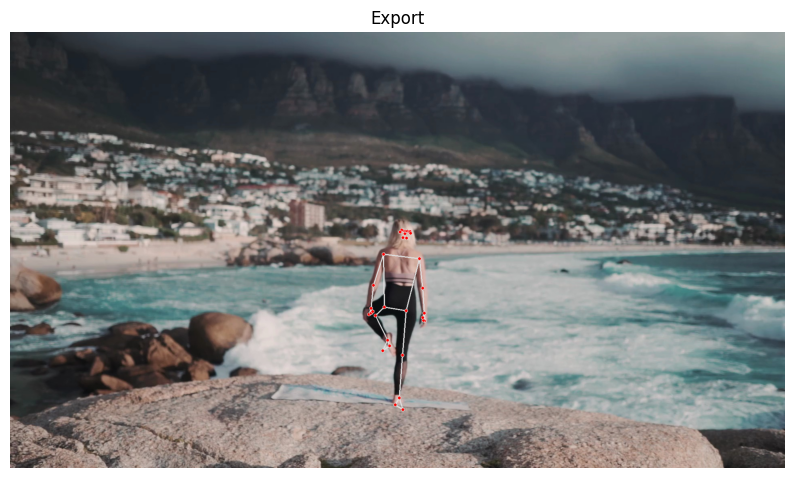

In [46]:
class A:
    def __init__(self, landmarker):
        self.landmark = landmarker
        
class B:
    def __init__(self, data):
        self.presence = data.presence
        self.x = data.x
        self.y = data.y
        self.z = data.z
        self.visibility = data.visibility
        
    def HasField(self, field):
        return True
    
lst = []
for i in pose_landmarker_result.pose_landmarks[0]:
    lst.append(B(i))

tmp = A(lst)

mpDraw.draw_landmarks(imgCopy, tmp, connections=connection)
fig = plt.figure(figsize=[10, 10])
plt.title('Export')
plt.axis('off')
plt.imshow(imgCopy[:, :, ::-1])
plt.show()


In [45]:
connection = frozenset({(0, 1),
           (0, 4),
           (1, 2),
           (2, 3),
           (3, 7),
           (4, 5),
           (5, 6),
           (6, 8),
           (9, 10),
           (11, 12),
           (11, 13),
           (11, 23),
           (12, 14),
           (12, 24),
           (13, 15),
           (14, 16),
           (15, 17),
           (15, 19),
           (15, 21),
           (16, 18),
           (16, 20),
           (16, 22),
           (17, 19),
           (18, 20),
           (23, 24),
           (23, 25),
           (24, 26),
           (25, 27),
           (26, 28),
           (27, 29),
           (27, 31),
           (28, 30),
           (28, 32),
           (29, 31),
           (30, 32)})
